In [1]:
import sys
import subprocess

#import pkg_resources
#required = {'harmonypy','sklearn','scanpy','pandas', 'numpy', 'bbknn', 'scipy', 'matplotlib', 'seaborn' ,'scipy'}
#installed = {pkg.key for pkg in pkg_resources.working_set}
#missing = required - installed
#if missing:
#    print("Installing missing packages:" )
#    print(missing)
#    python = sys.executable
#    subprocess.check_call([python, '-m', 'pip', 'install', *missing], stdout=subprocess.DEVNULL)

%matplotlib inline
from collections import Counter
from collections import defaultdict
import scanpy as sc
import pandas as pd
import pickle as pkl
import numpy as np
from bbknn import bbknn
import scipy
import matplotlib.pyplot as plt
import re
import glob
import os
import sys
from geosketch import gs
from numpy import cov
import scipy.cluster.hierarchy as spc
import seaborn as sns; sns.set(color_codes=True)
from sklearn.linear_model import LogisticRegression
import sklearn
import harmonypy as hm
from pathlib import Path

In [2]:
sc.settings.set_figure_params(dpi=300, color_map='viridis')
plt.rcParams['figure.figsize'] = [5, 5]

In [16]:
adata = sc.read('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_data/A4_V7_YS_integrated_data_singlets_with_raw_counts_for_MS_plotting_20211111_with_obsp.h5ad')

In [17]:
adata.obsm

AxisArrays with keys: X_pca, X_umap

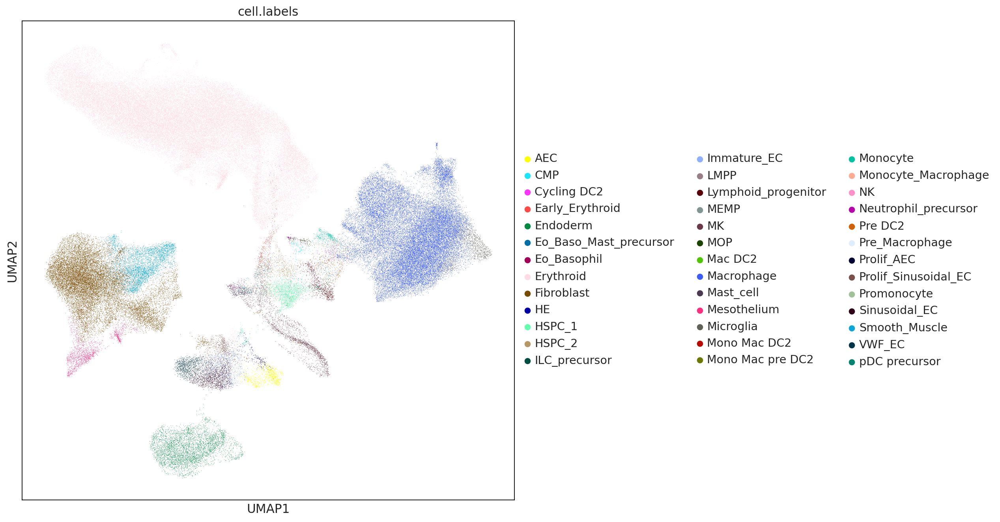

In [32]:
sc.pl.umap(adata,color='cell.labels')

In [33]:
# sc.pp.neighbors(adata_pre_mono  ,n_neighbors=30, n_pcs=5)
# sc.tl.umap(adata_pre_mono )
#sc.tl.draw_graph(adata , layout='fa')

In [129]:
# Try wyith al progen states
adata = adata[adata.obs['stage'].isin(['CS10', 'CS11','CS14'])]
adata = adata[adata.obs['cell.labels'].isin([
 'HSPC_2',
 'HSPC_1',
 'AEC',
 'HE',
 'Prolif_AEC','CMP','GMP','MEMP','LMPP'])]

In [20]:
#adata = adata[adata.obs['stage'].isin(['CS10', 'CS11','CS14'])]
adata = adata[adata.obs['cell.labels'].isin([
#  'MEMP',
 'HSPC_1',
#  'Erythroid',
#  'Early_Erythroid',
 'HSPC_2',
 'AEC',
 'HE',
 'Prolif_AEC'])]

In [21]:
adata.obs['stage'].unique()

['CS10', 'CS11', 'CS22', 'CS23', 'CS14', 'CS18', 'CS15']
Categories (7, object): ['CS10', 'CS11', 'CS14', 'CS15', 'CS18', 'CS22', 'CS23']

In [22]:
adata.obs['cell.labels'].unique()

['HSPC_1', 'HSPC_2', 'AEC', 'HE', 'Prolif_AEC']
Categories (5, object): ['AEC', 'HE', 'HSPC_1', 'HSPC_2', 'Prolif_AEC']

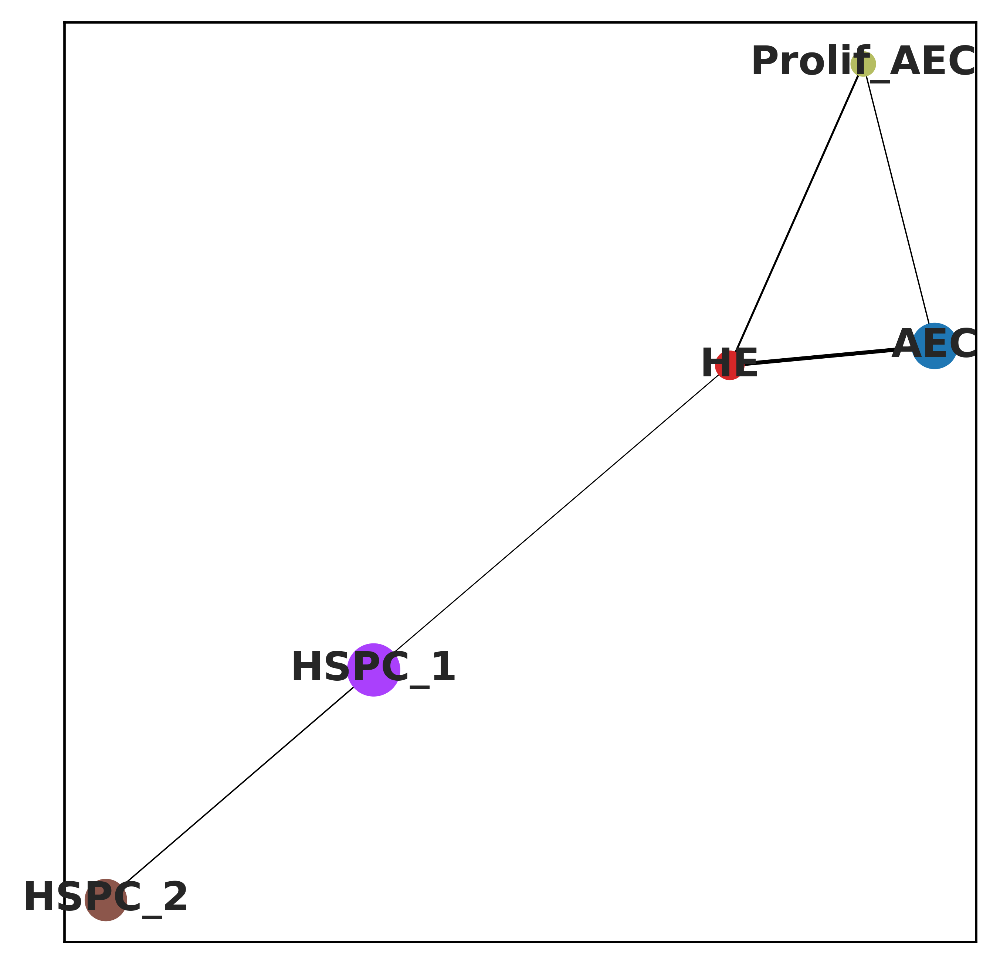

In [23]:
sc.pp.neighbors(adata  ,n_neighbors=15, n_pcs=10)
sc.tl.paga(adata, groups='cell.labels', use_rna_velocity=False, model='v1.2', neighbors_key=None, copy=False)
sc.pl.paga(adata,threshold=0.2 , title='',edge_width_scale=0.2)
sc.tl.draw_graph(adata , layout='fa', init_pos='paga')

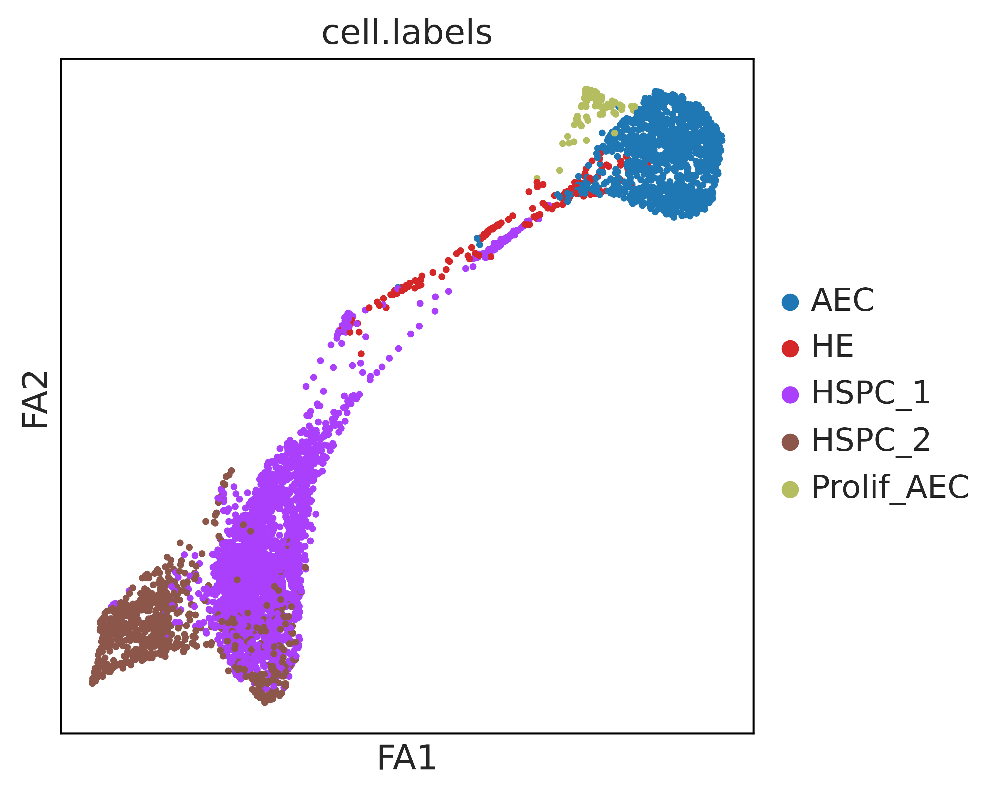

In [24]:
sc.pl.draw_graph(adata,color = 'cell.labels')

In [25]:
cells = adata.obs['cell.labels'].cat.categories
embed = 'X_draw_graph_fa'
pos = []
for i in cells:
    tmp = adata[adata.obs['cell.labels'].isin([i])]
    tmp_emded = tmp.obsm[embed]
    # get centroids
    x = [p[0] for p in tmp_emded]
    y = [p[1] for p in tmp_emded]
    centroid = (sum(x) / len(tmp_emded), sum(y) / len(tmp_emded))
    pos.append(centroid)
    
adata.uns['paga-back'] = adata.uns['paga'].copy()
adata.uns['paga']['pos']= np.array(pos)

# Plot Paga overlay

In [3]:
adata = sc.read('/nfs/team205/ig7/work_backups/backup_210306/projects/YS/YS_310122_notebooks/fig4_endo/AEC_HE_SPC_traj/HE_HSC_transition_v1.h5ad')

In [5]:
adata

AnnData object with n_obs × n_vars = 2262 × 30330
    obs: 'cell.labels', 'stage', 'lanes', 'sex', 'sort.ids', 'fetal.ids', 'component', 'broad_cell.labels', 'sequencing.type', 'orig.dataset', 'broad_cell_labels_organ', 'tissue', 'V6_old_indexes', 'n_counts', 'col'
    var: 'n_cells', 'mt', 'total_counts', 'highly_variable', 'intersect', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'broad_cell.labels_colors', 'cell.labels_colors', 'cell.labels_sizes', 'diffmap_evals', 'draw_graph', 'hvg', 'neighbors', 'paga', 'paga-back', 'rank_genes_groups'
    obsm: 'X_diffmap', 'X_draw_graph_fa', 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

In [4]:
adata.obs.groupby(['fetal.ids']).apply(len)

fetal.ids
F37           164
Wang_CS10     177
Wang_CS11    1921
dtype: int64

In [42]:
cell_label_pal = ("/nfs/team205/ig7/work_backups/backup_210306/projects/YS/resources/ys_cell_labels_pal_150921.csv")

In [43]:
## Vars
adata_var = "cell.labels"
var = 'cell.labels'
col_pal = cell_label_pal 

In [34]:
#Check if all cats are indeed available
pal = pd.read_csv(col_pal)
#Uppercase everything
pal = pal.apply(lambda x: x.astype(str).str.upper())
# Create a field to assign gray coloring to
adata.obs["var"] = adata.obs[adata_var].astype(str)
var = 'var'
adata.obs['var'] = adata.obs['var'].astype(str).str.upper()
#Not in intersect
intersecting = set(list(pal["categories"])) & set(list(adata.obs['var'].unique()))
print(len(intersecting),intersecting)
print("non_intersect",set(list(pal["categories"])) ^ set(list(adata.obs['var'].unique())))

# Create a color mapper
adata.obs["var"] = adata.obs["var"].astype('category')
cells = list(adata.obs["var"].cat.categories)
pal = pal[pal["categories"].isin(cells)]
#cells.append(alternate_name)
col = list(range(0,len(cells)))
#Add gray color for alternate category
#pal.loc[len(pal)+1]= [alternate_name,"#808080"]
pal = pal.set_index('categories')
pal = pal.loc[cells]
col_pal = list(pal["color"])

adata.uns[adata_var+'_colors'] = col_pal

5 {'PROLIF_AEC', 'HSPC_1', 'HE', 'AEC', 'HSPC_2'}
non_intersect {'IMMATURE_EC', 'SMOOTH_MUSCLE', 'MONOCYTE_MACROPHAGE', 'EO_BASO_MAST_PRECURSOR', 'PRE_MACROPHAGE', 'MONOCYTE', 'ENDODERM', 'EO_BASOPHIL', 'FIBROBLAST', 'MK', 'NEUTROPHIL_PRECURSOR', 'DC2', 'MESOTHELIUM', 'NK', 'ERYTHROID', 'MICROGLIA', 'EARLY_ERYTHROID', 'PROLIF_SINUSOIDAL_EC', 'DC_PRECURSOR', 'MEMP', 'MACROPHAGE', 'MAST_CELL', 'LYMPHOID_PROGENITOR', 'SINUSOIDAL_EC', 'LMPP', 'VWF_EC', 'CMP', 'MOP', 'ILC_PRECURSOR', 'PROMONOCYTE'}


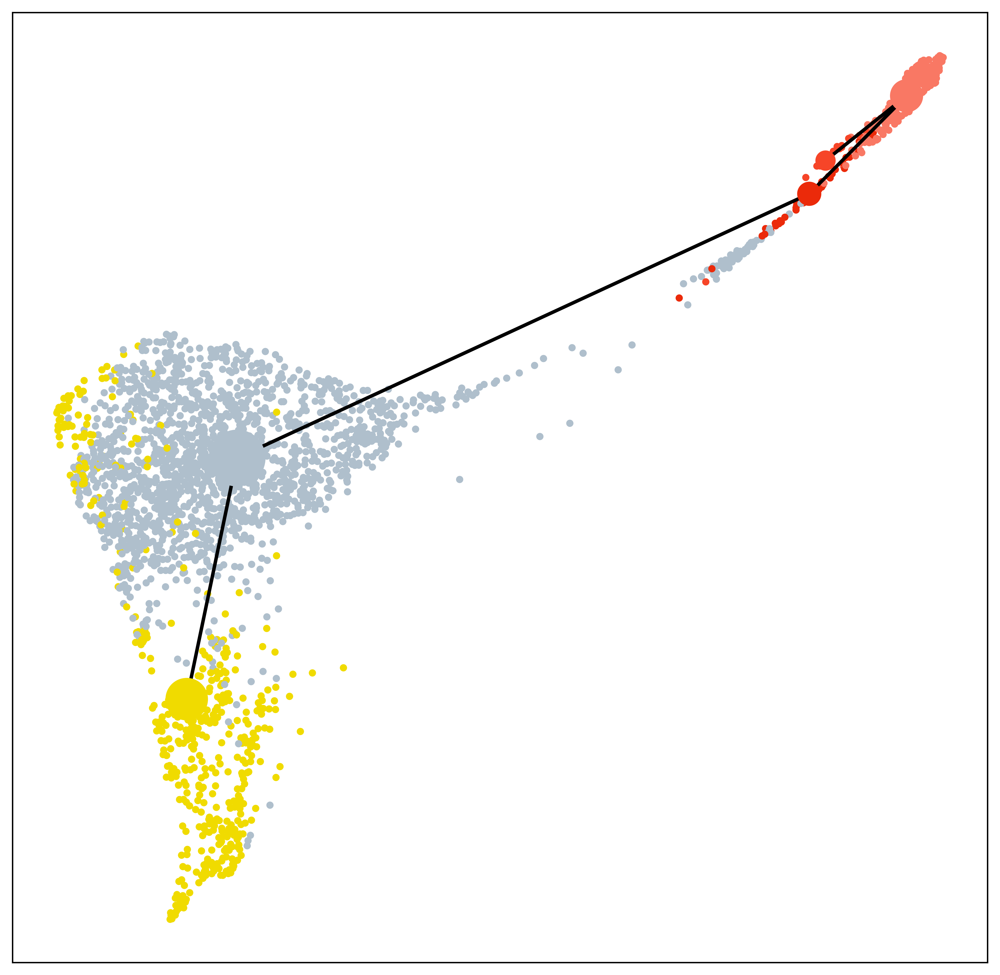

AEC
HE
HSPC_1
HSPC_2
Prolif_AEC


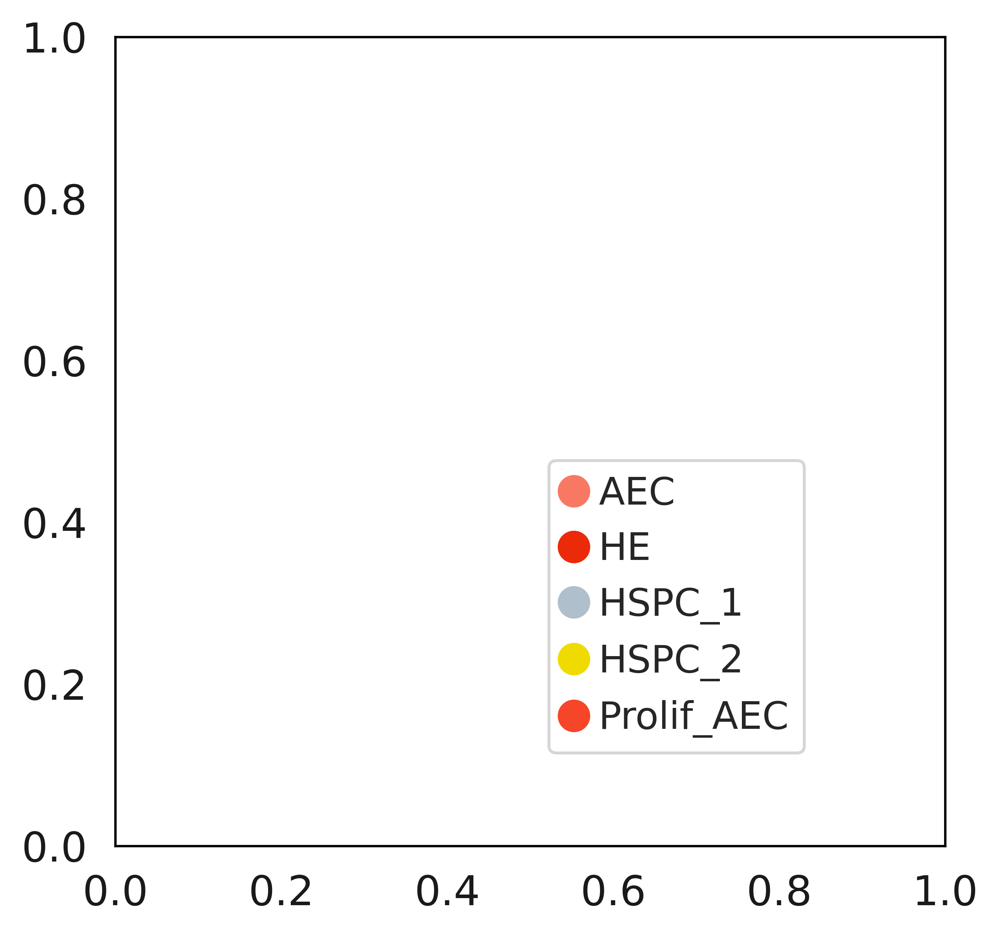

In [37]:
fig, ax = plt.subplots(1,figsize=(10,10))

var = 'cell.labels'

mapper = dict(zip(list(adata.obs[var].cat.categories),list(adata.uns[var+'_colors'])))
adata.obs['col'] = adata.obs[var].astype(str).map(mapper)
ax.scatter(adata.obsm['X_draw_graph_fa'][:,0], adata.obsm['X_draw_graph_fa'][:,1],c=adata.obs['col'],s=10)
sc.pl.paga(adata, threshold=0.2 , title='',edge_width_scale=2,max_edge_width=2 ,pos = adata.uns['paga']['pos'],fontsize=0 ,fontoutline=0 ,  text_kwds={'alpha':0},labels = None,fontweight='bold',save = 'HE_paga',node_size_scale=2.0,ax=ax)
# sc.pl.draw_graph(adata,color = var,ax=ax)
# ax.set_zorder(-1)
#Make legends

# box = ax.get_position()
# ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

import matplotlib.lines as mlines
legends = []
for legend in adata.obs[var].cat.categories:
    print(legend)
    legends.append(mlines.Line2D([], [], color=mapper[legend], marker='o', linestyle='None',
                          markersize=10, label=legend))
ax.grid(False)
plt.grid(False)
plt.legend(handles=legends,loc="upper left",bbox_to_anchor=(0.5, 0.5))
# plt.savefig("./figures/legends_HE_HSC_Paga_overlay.pdf")
# fig.savefig("./figures/HE_HSC_Paga_overlay_no_legned.pdf", dpi=300,bbox_inches='tight')

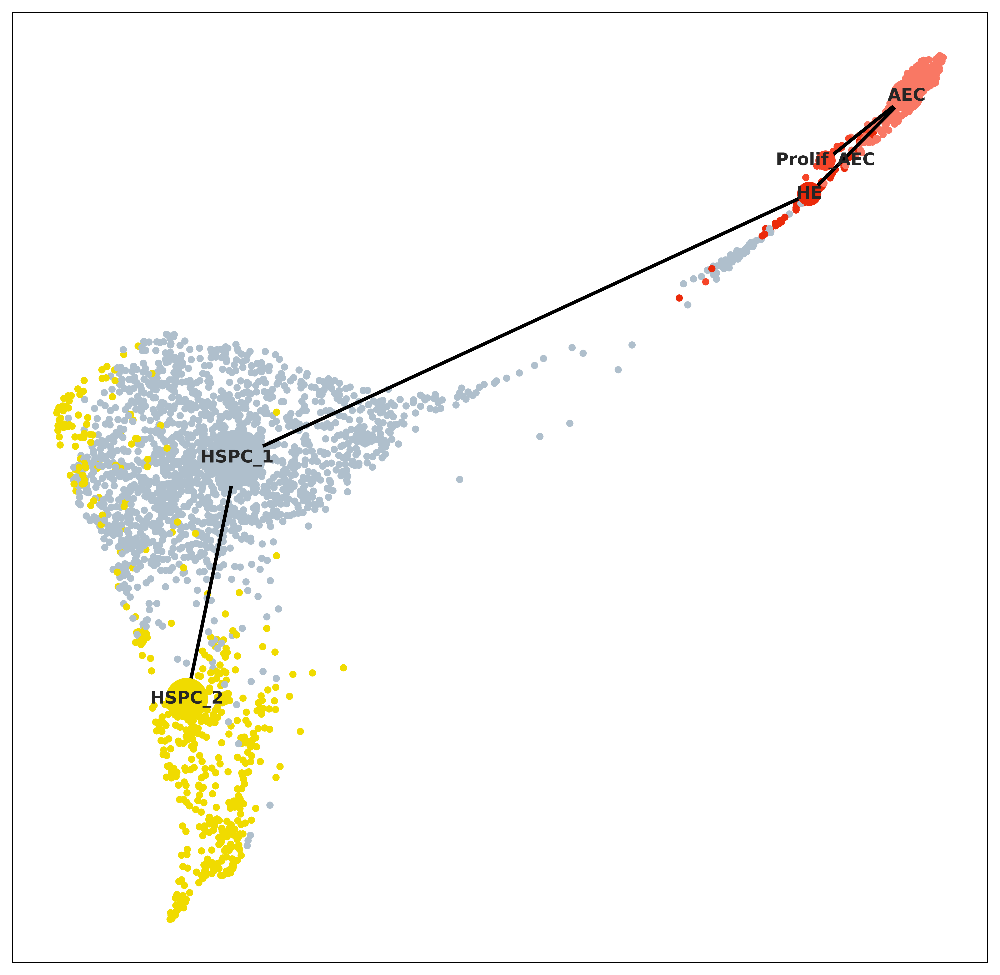

AEC
HE
HSPC_1
HSPC_2
Prolif_AEC


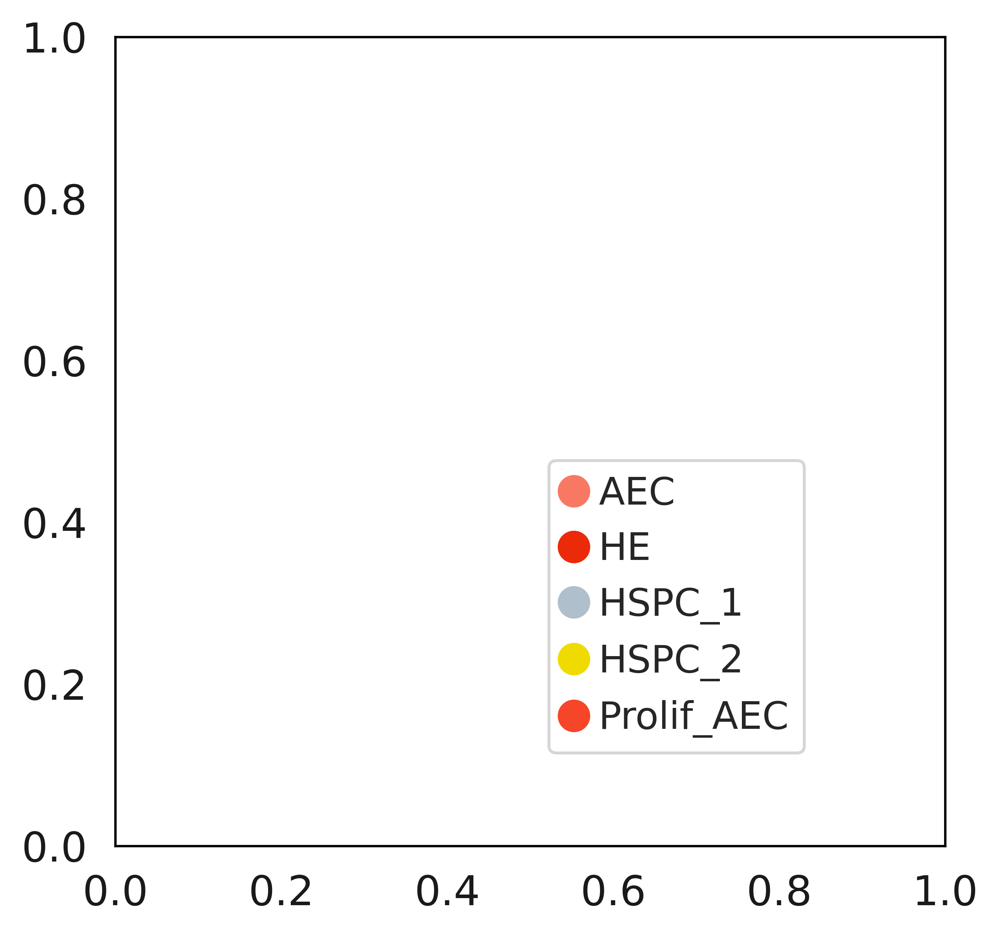

In [38]:
fig, ax = plt.subplots(1,figsize=(10,10))

var = 'cell.labels'

mapper = dict(zip(list(adata.obs[var].cat.categories),list(adata.uns[var+'_colors'])))
adata.obs['col'] = adata.obs[var].astype(str).map(mapper)
ax.scatter(adata.obsm['X_draw_graph_fa'][:,0], adata.obsm['X_draw_graph_fa'][:,1],c=adata.obs['col'],s=10)
sc.pl.paga(adata, threshold=0.2 , title='',edge_width_scale=2,max_edge_width=2 ,pos = adata.uns['paga']['pos'],fontsize=10 ,fontoutline=0 ,labels = None,fontweight='bold',save = 'HE_paga',node_size_scale=2.0,ax=ax)
# sc.pl.draw_graph(adata,color = var,ax=ax)
# ax.set_zorder(-1)
#Make legends

# box = ax.get_position()
# ax.set_position([box.x0, box.y0, box.width * 0.8, box.height])

import matplotlib.lines as mlines
legends = []
for legend in adata.obs[var].cat.categories:
    print(legend)
    legends.append(mlines.Line2D([], [], color=mapper[legend], marker='o', linestyle='None',
                          markersize=10, label=legend))
ax.grid(False)
plt.grid(False)
plt.legend(handles=legends,loc="upper left",bbox_to_anchor=(0.5, 0.5))
plt.savefig("./figures/legends_HE_HSC_Paga_overlay")
fig.savefig("./figures/HE_HSC_Paga_overlay", dpi=300,bbox_inches='tight')

In [ ]:
vmin : str | float | (Sequence[float]) → float | Sequence[Union[str, float, Callable[[Sequence[float]], float]]] | None (default: None)
The value representing the lower limit of the color scale. Values smaller than vmin are plotted with the same color as vmin. vmin can be a number, a string, a function or None. If vmin is a string and has the format pN, this is interpreted as a vmin=percentile(N). For example vmin=’p1.5’ is interpreted as the 1.5 percentile. If vmin is function, then vmin is interpreted as the return value of the function over the list of values to plot. For example to set vmin tp the mean of the values to plot, def my_vmin(values): return np.mean(values) and then set vmin=my_vmin. If vmin is None (default) an automatic minimum value is used as defined by matplotlib scatter function. When making multiple plots, vmin can be a list of values, one for each plot. For example vmin=[0.1, 'p1', None, my_vmin]

vmax : str | float | (Sequence[float]) → float | Sequence[Union[str, float, Callable[[Sequence[float]], float]]] | None (default: None)
The value representing the upper limit of the color scale. The format is the same as for vmin.

vcenter 

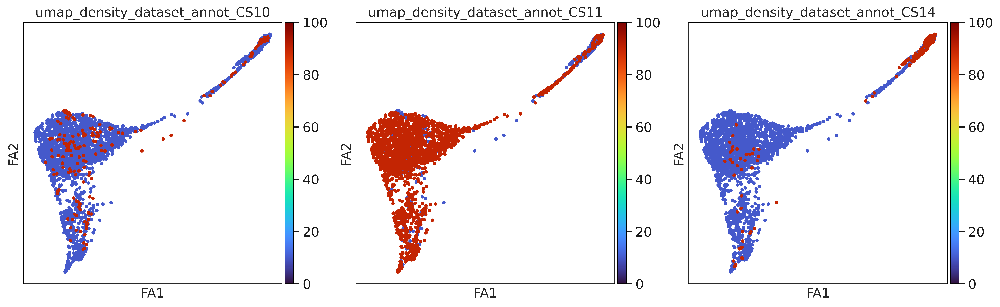

In [57]:
# Estimate cluster centroid position by density
sc.tl.embedding_density(adata, groupby='stage')
pos = []
map_scores = []
for i in adata.obs['stage'].cat.categories:
    # make bg blue
    adata.obs['umap_density_dataset_annot_'+i] = adata.obs['umap_density_stage']
    adata.obs.loc[~adata.obs['stage'].isin([i]),('umap_density_dataset_annot_'+i)] = 10
    adata.obs.loc[adata.obs['stage'].isin([i]),('umap_density_dataset_annot_'+i)] = 90
    #sc.pl.umap(adata,color = ('umap_density_dataset_annot_'+i),color_map = 'turbo')
    
    map_scores.append('umap_density_dataset_annot_'+i)
    tmp_fa= adata.obsm['X_draw_graph_fa'][adata.obs['umap_density_dataset_annot_'+i] == np.max(adata.obs['umap_density_dataset_annot_'+i])]
    
adata.uns['paga-back'] = adata.uns['paga'].copy()
adata.uns['paga']['pos']= np.array(pos)
sc.pl.draw_graph(adata,color = map_scores,color_map = 'turbo',legend_loc=None,save = 'HE_AEC_HSPC_time.pdf',vmin = 0 ,vmax = 100 ,vcenter = 50)

In [ ]:
sc.pl.draw_graph(adata,color = 'stage' , edges=False, edges_width=0.1,save = 'HE_by_time')

In [ ]:
sc.pl.draw_graph(adata,color = 'stage' , edges=False, edges_width=0.1,save = 'HE_by_time')

In [140]:
adata.write('./HE_HSC_transition_v1.h5ad')
# adata.write('./HE_HSC_transition_v1_with_cmp_gmp.h5ad')

/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
... storing 'col' as categorical


In [5]:
adata = sc.read('./HE_HSC_transition_v1.h5ad')

In [6]:
adata_raw = adata[:]

In [7]:
adata

AnnData object with n_obs × n_vars = 2262 × 30330
    obs: 'cell.labels', 'stage', 'lanes', 'sex', 'sort.ids', 'fetal.ids', 'component', 'broad_cell.labels', 'sequencing.type', 'orig.dataset', 'broad_cell_labels_organ', 'tissue', 'V6_old_indexes', 'n_counts', 'col'
    var: 'n_cells', 'mt', 'total_counts', 'highly_variable', 'intersect', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'broad_cell.labels_colors', 'cell.labels_colors', 'cell.labels_sizes', 'diffmap_evals', 'draw_graph', 'hvg', 'neighbors', 'paga', 'paga-back', 'rank_genes_groups'
    obsm: 'X_diffmap', 'X_draw_graph_fa', 'X_pca', 'X_umap'
    obsp: 'connectivities', 'distances'

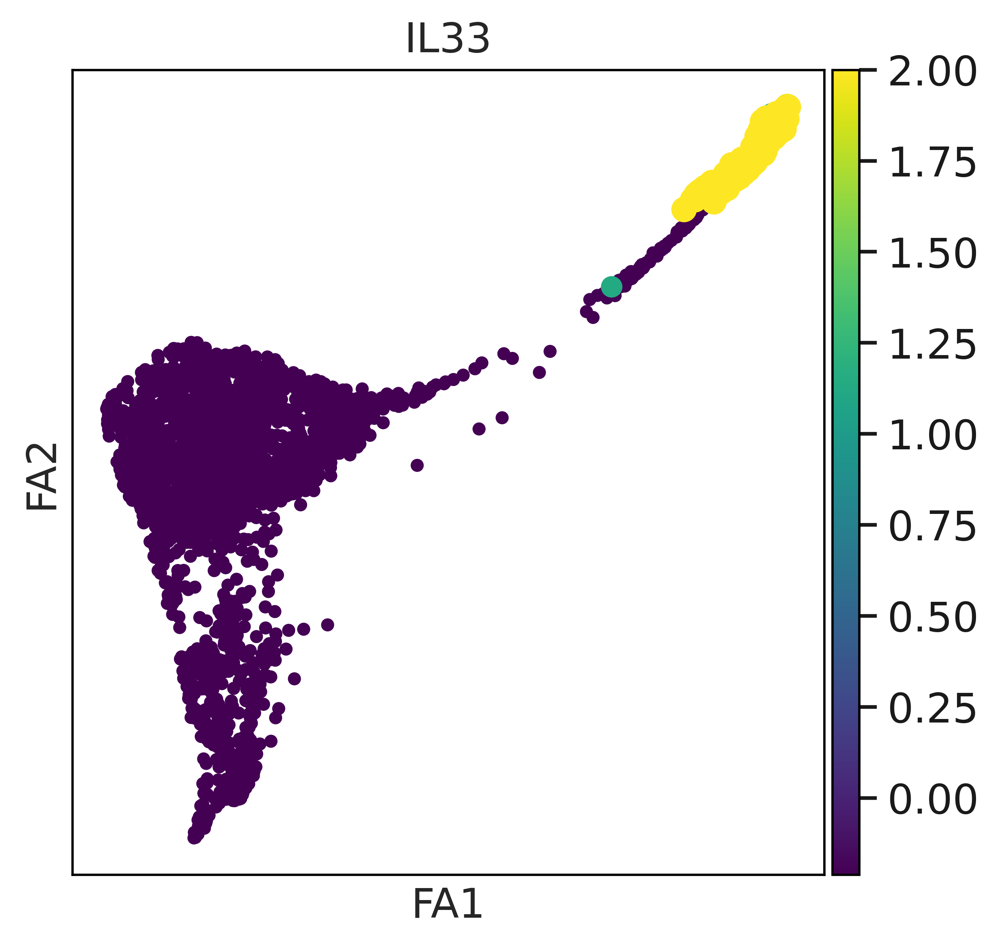

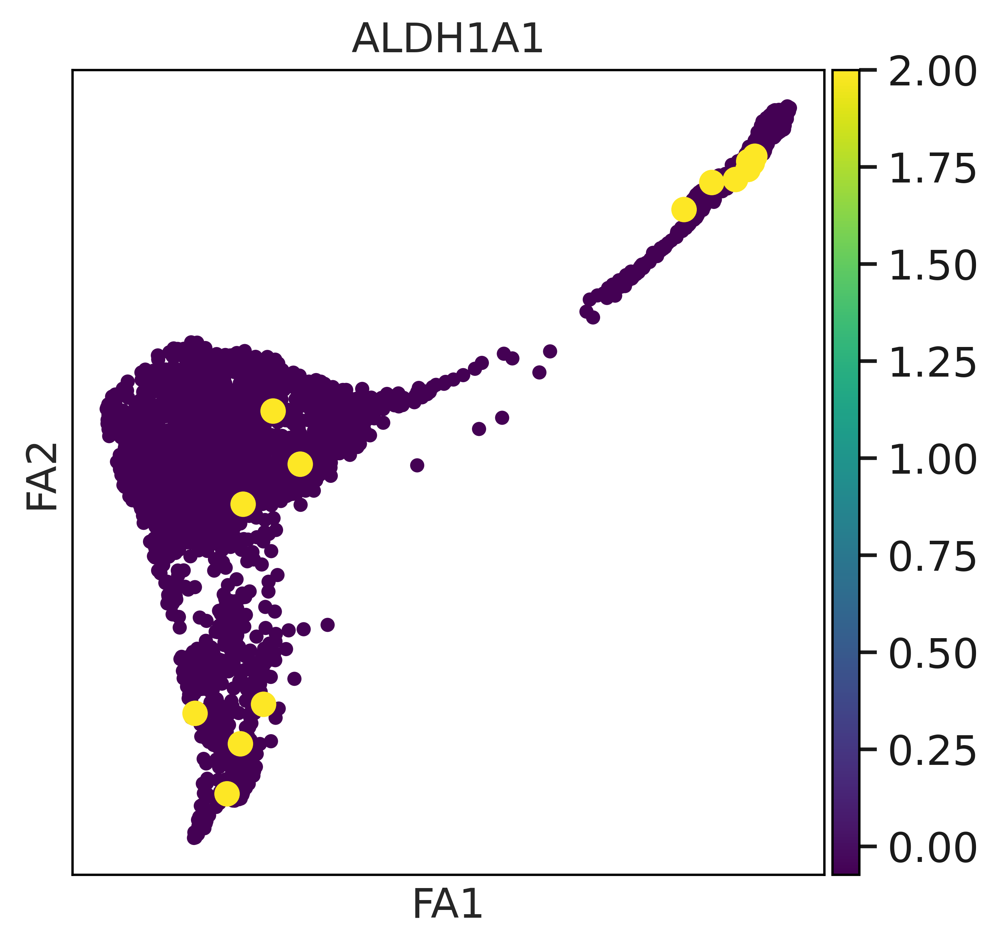

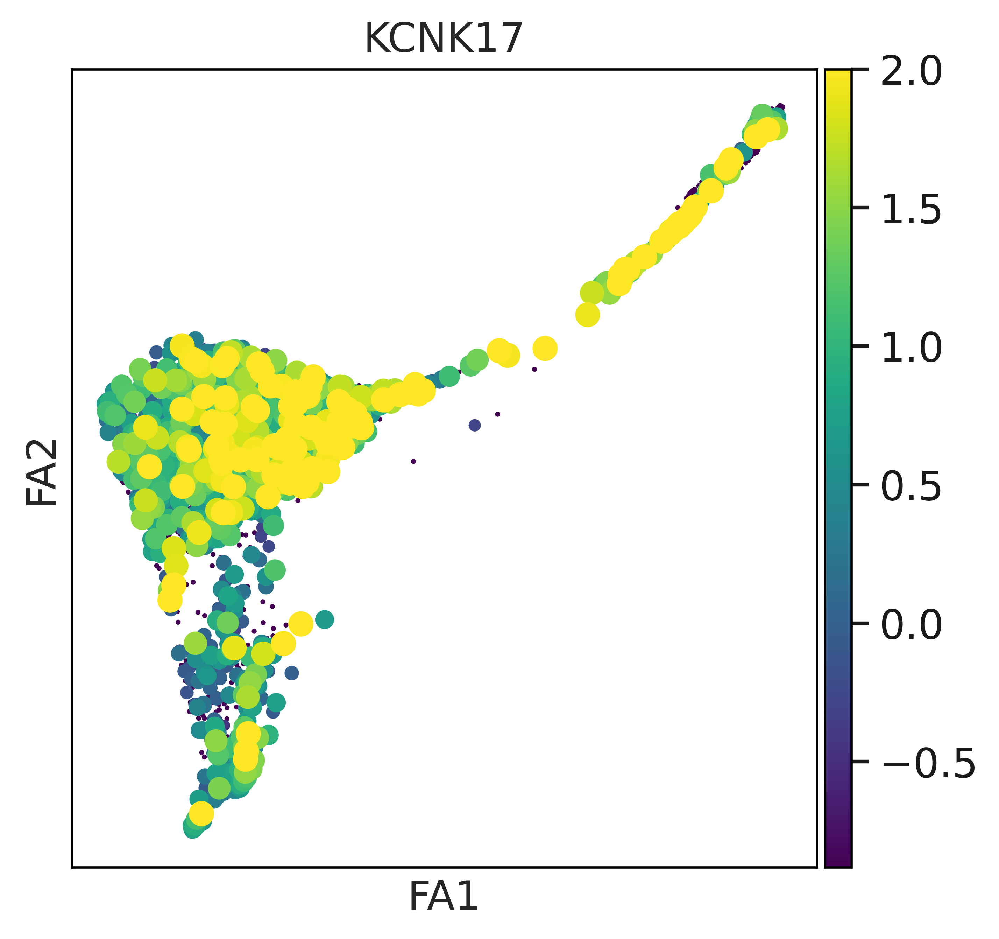

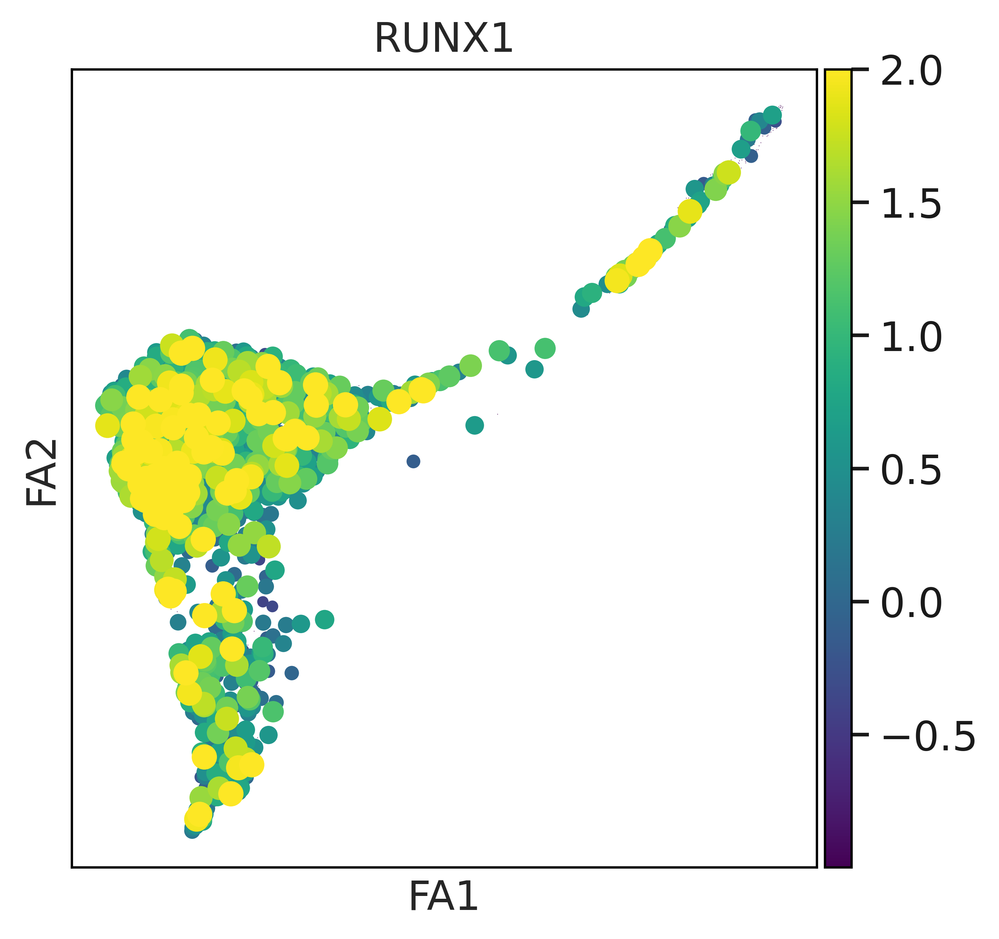

/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


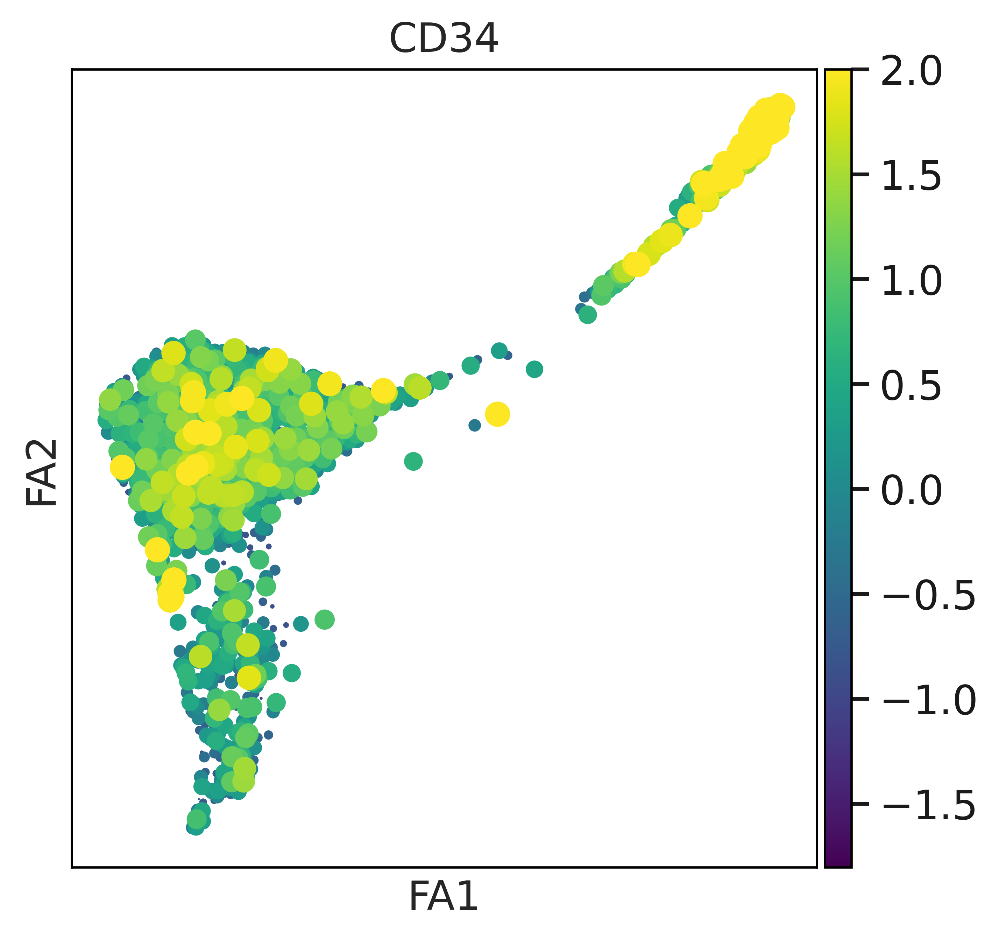

/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


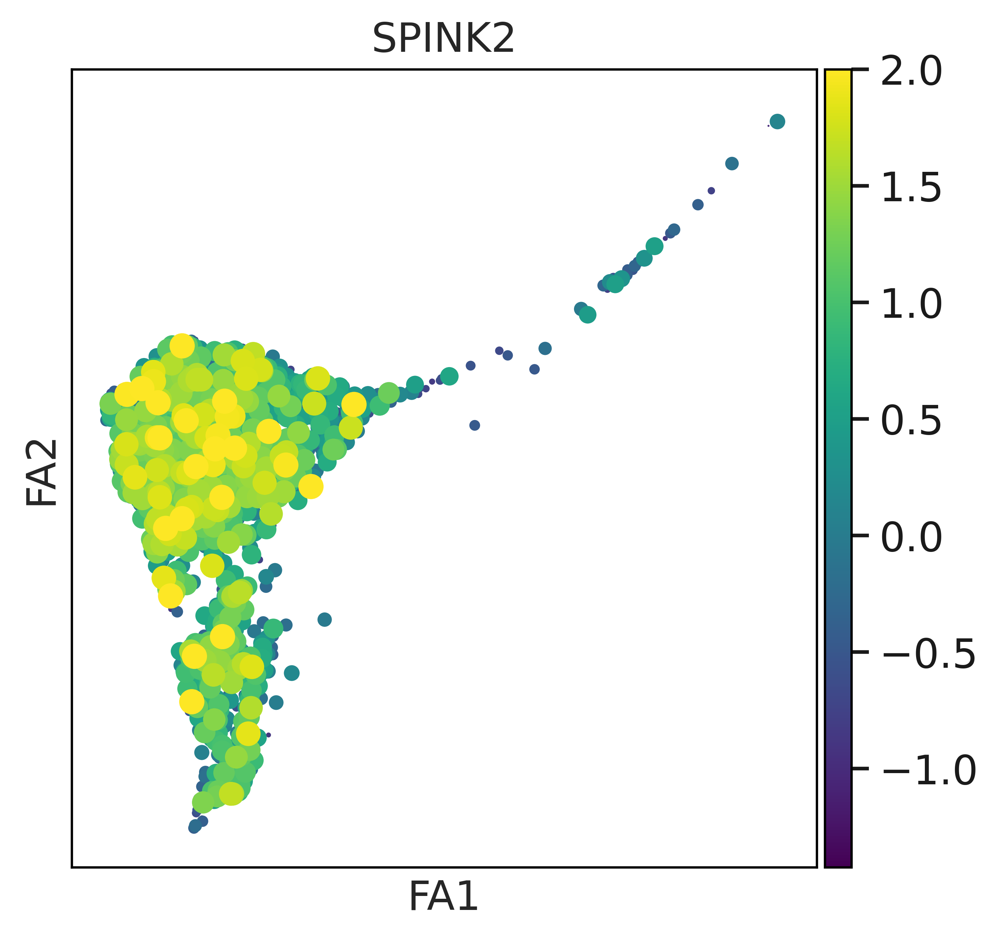

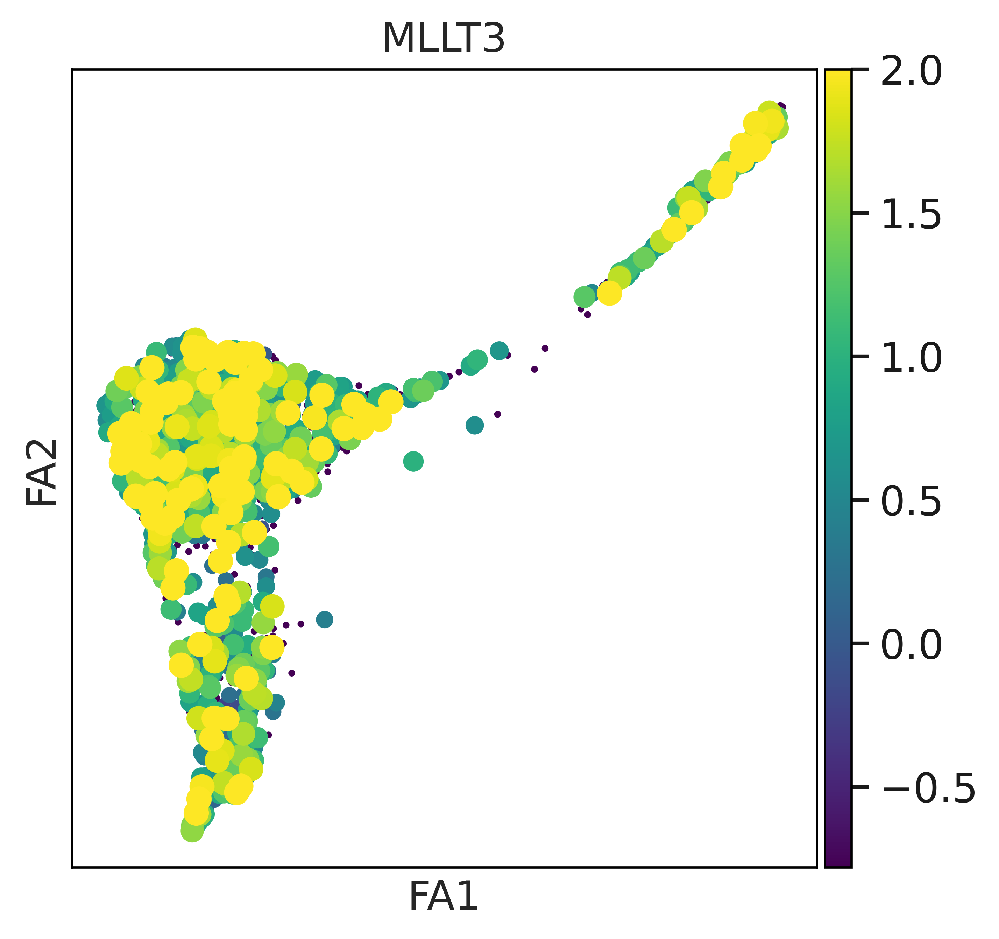

/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor
/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/matplotlib/collections.py:922: RuntimeWarning: invalid value encountered in sqrt
  scale = np.sqrt(self._sizes) * dpi / 72.0 * self._factor


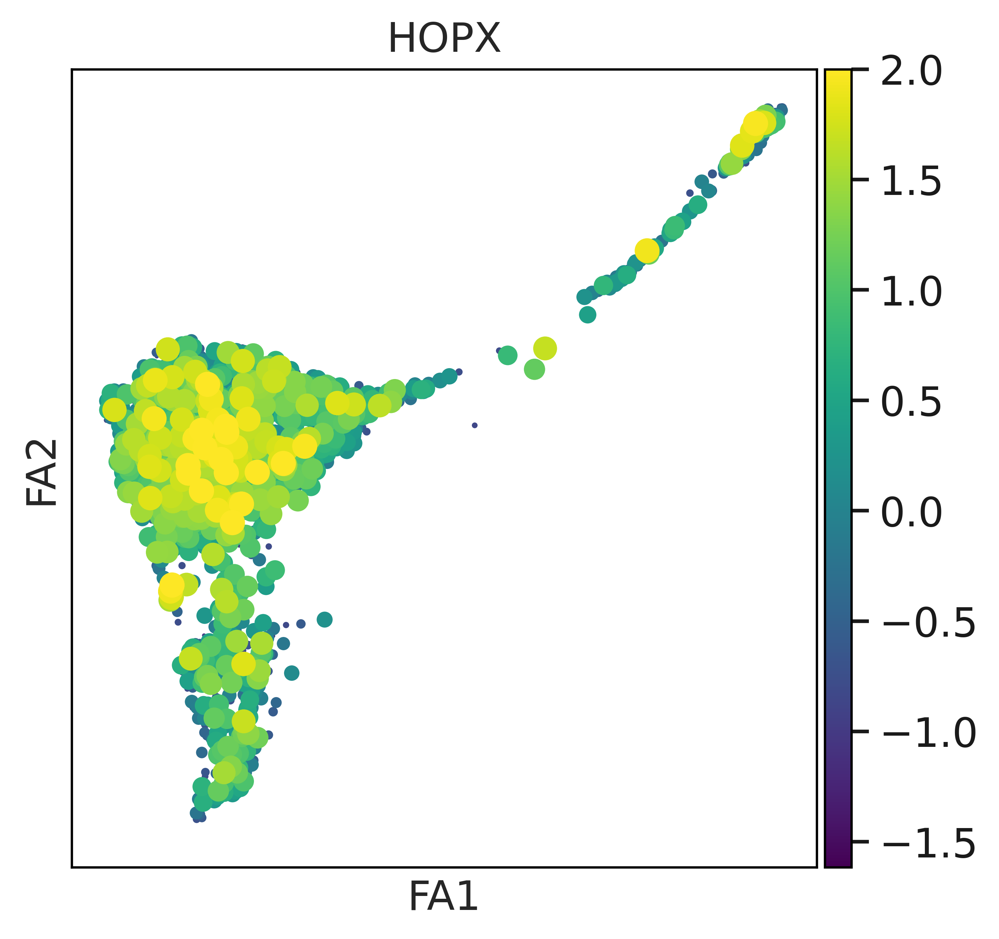

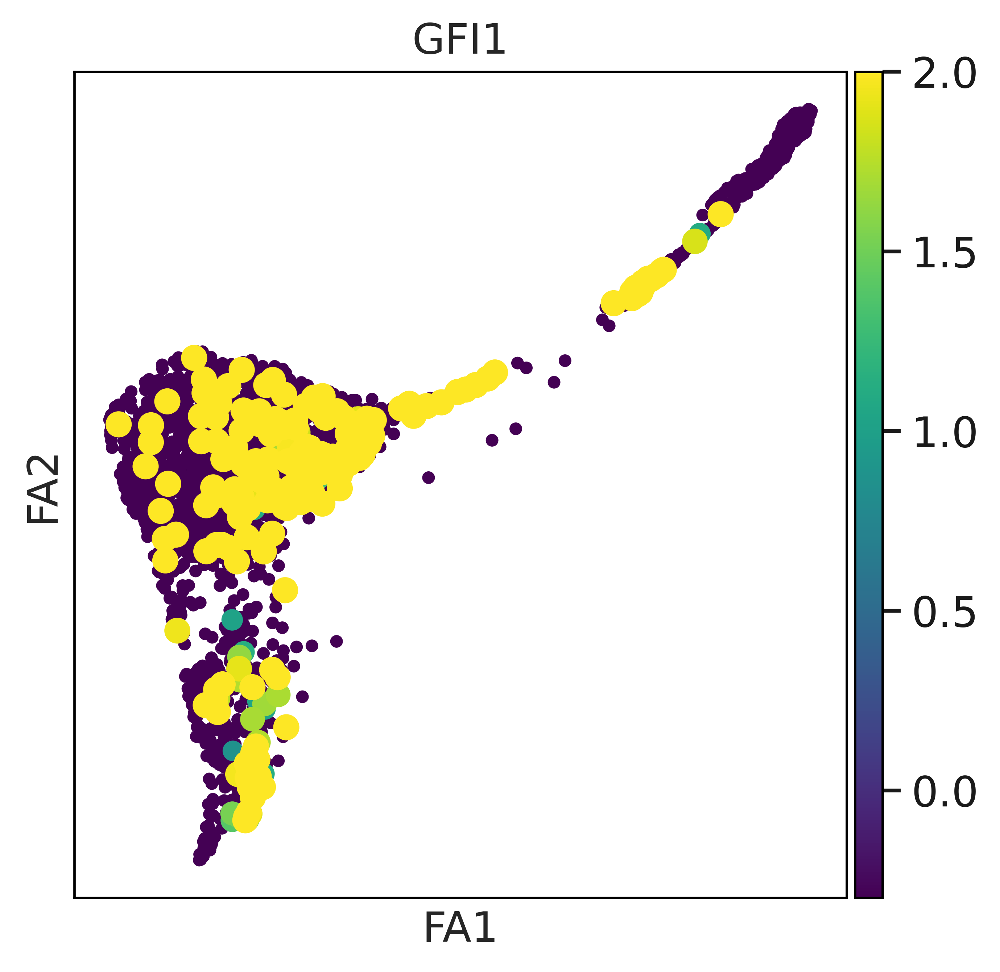

In [8]:
keys = ['IL33','ALDH1A1','KCNK17','RUNX1','CD34','SPINK2','MLLT3','HOPX','GFI1']
for key in list(range(0,len(keys))):
    sc.pl.draw_graph(adata,color = keys[key] ,size=((adata_raw[:, [keys[key]]].X)+1)*100, edges=False, edges_width=0.1,save = keys[key])

In [ ]:
keys = ['IL33','ALDH1A1','KCNK17','RUNX1','CD34','SPINK2','MLLT3','HOPX']
fig, axs = plt.subplots(2,int(len(keys)/2), figsize=(35, 15), facecolor='w', edgecolor='k')
fig.subplots_adjust(hspace = .5, wspace=0.1)
axs = axs.ravel()

for key in list(range(0,len(keys))):
    sc.pl.draw_graph(adata,color = keys[key] ,size=((adata_raw[:, [keys[key]]].X)+1)*50, edges=False, edges_width=0.1,ax= axs[key])
fig.show()

In [ ]:
((adata_raw[:, [key]].X))

In [ ]:
for key in ['IL33','ALDH1A1','KCNK17','RUNX1','CD34','SPINK2','MLLT3','HOPX']:
    sc.pl.draw_graph(adata,color =key ,size=((adata_raw[:, [key]].X)+1)*100, edges=False, edges_width=0.1, color_map='viridis')

In [216]:
sc.pl.draw_graph(adata,color = ['IL33','ALDH1A1','KCNK17','RUNX1','CD34','SPINK2','MLLT3','HOPX','PROM1'] ,size=((adata[:, ['IL33']].X)+10)*50, edges=False, edges_width=0.1,save = 'HE_fdg')

In [18]:
markers = {
'AEC_HE_transition':['IL33','ALDH1A1','KCNK17',],
'HE_HSPC1_transition':['CD34','RUNX1','GFI1'],
'HSC_markers':['SPINK2','MLLT3','HOPX'],
#'HSC_maturation':['CD9','CD81','HLA-DRA','PROM1'],
}

In [19]:
adata.obs['cell.labels'].cat.categories = ['AEC', 'Prolif_AEC','HE', 'HSPC_1', 'HSPC_2']

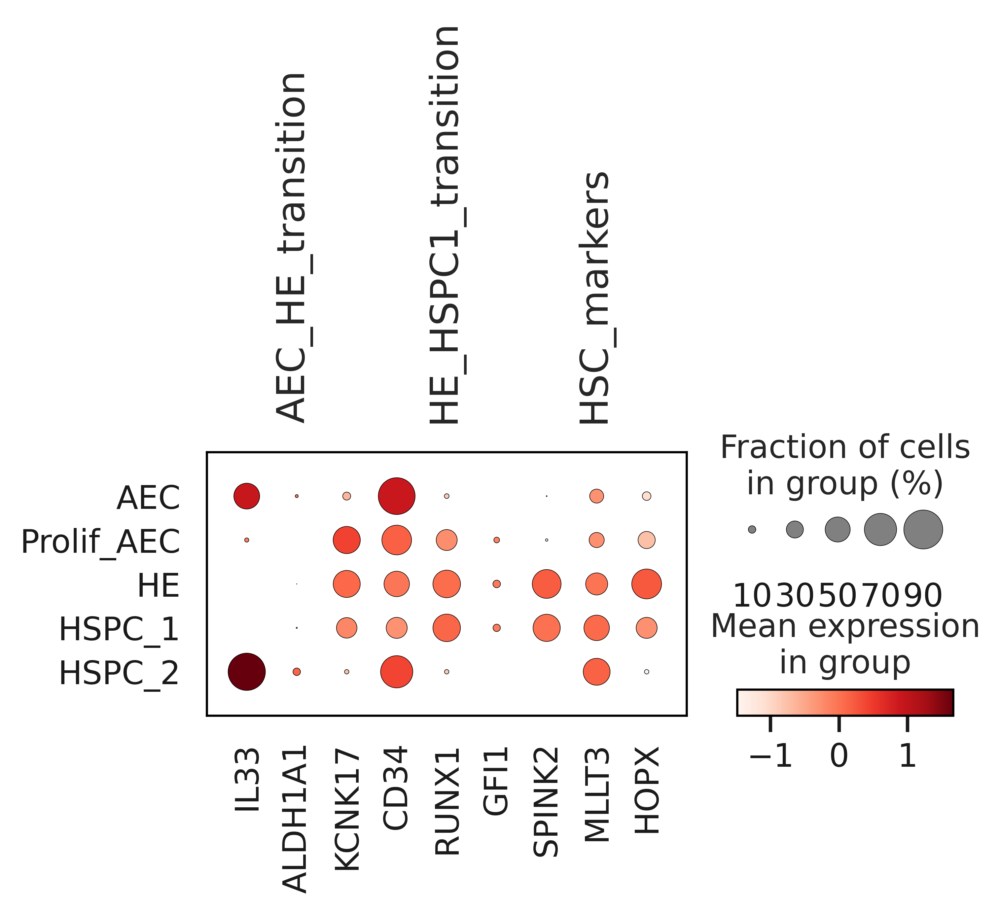

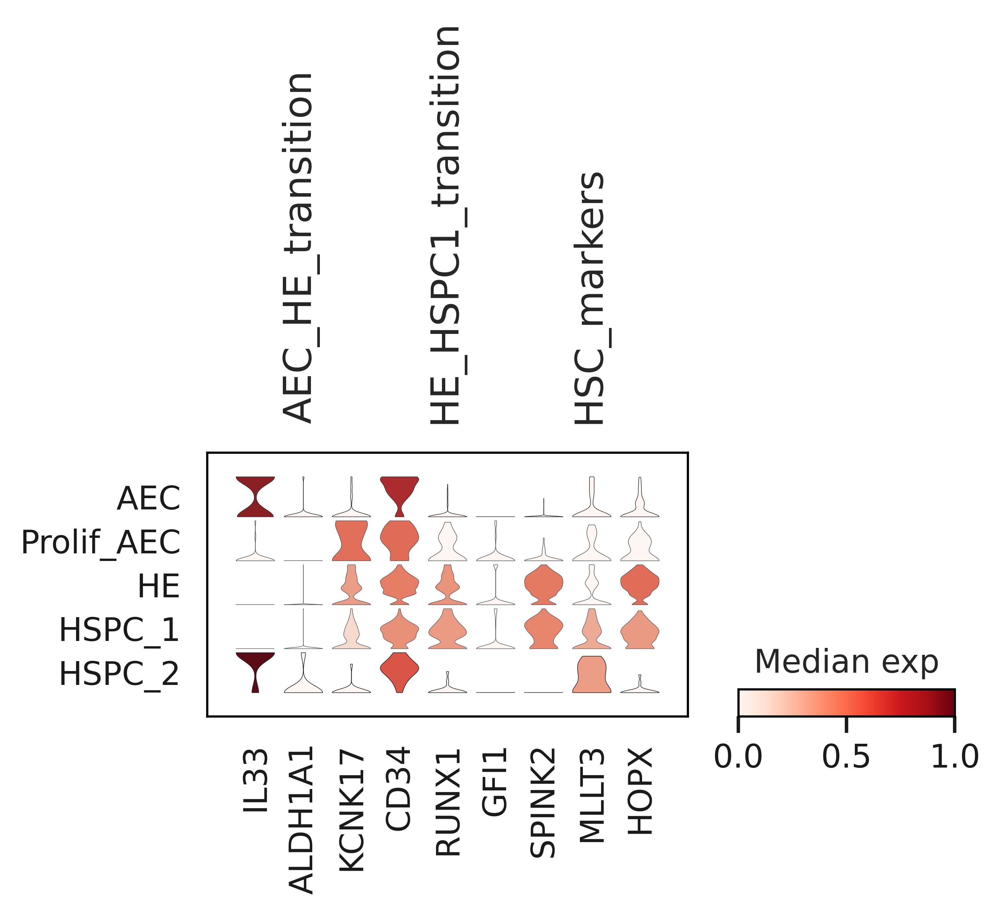

In [20]:
data_temp = adata
markers = markers
spot_var = 'cell.labels'
save_title = 'HE_origin_traj_markers'

(sc.pl.dotplot(data_temp, var_names = markers, groupby=spot_var,dendrogram=False, color_map='Reds', show = True,standard_scale=None,save =save_title))
sc.pl.stacked_violin(data_temp ,var_names= markers, groupby=spot_var,  log=False, use_raw=None, num_categories=7, title=None, colorbar_title='Median exp', figsize=None, dendrogram=False, gene_symbols=None, var_group_positions=None, var_group_labels=None, standard_scale='var', var_group_rotation=None, layer=None, stripplot=False, jitter=False, size=1, scale='width', yticklabels=False, order=None, swap_axes=False, show=None, save=save_title, return_fig=False, row_palette=None, cmap='Reds', ax=None, vmin=None, vmax=None, vcenter=None, norm=None)

# interpolated cloud

/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/anndata/_core/anndata.py:1220: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Removing unused categories will always return a new Categorical object.
  c.reorder_categories(natsorted(c.categories), inplace=True)
/home/jovyan/my-conda-envs/workhorse/lib/python3.8/site-packages/anndata/_core/anndata.py:1228: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'col' as categorical


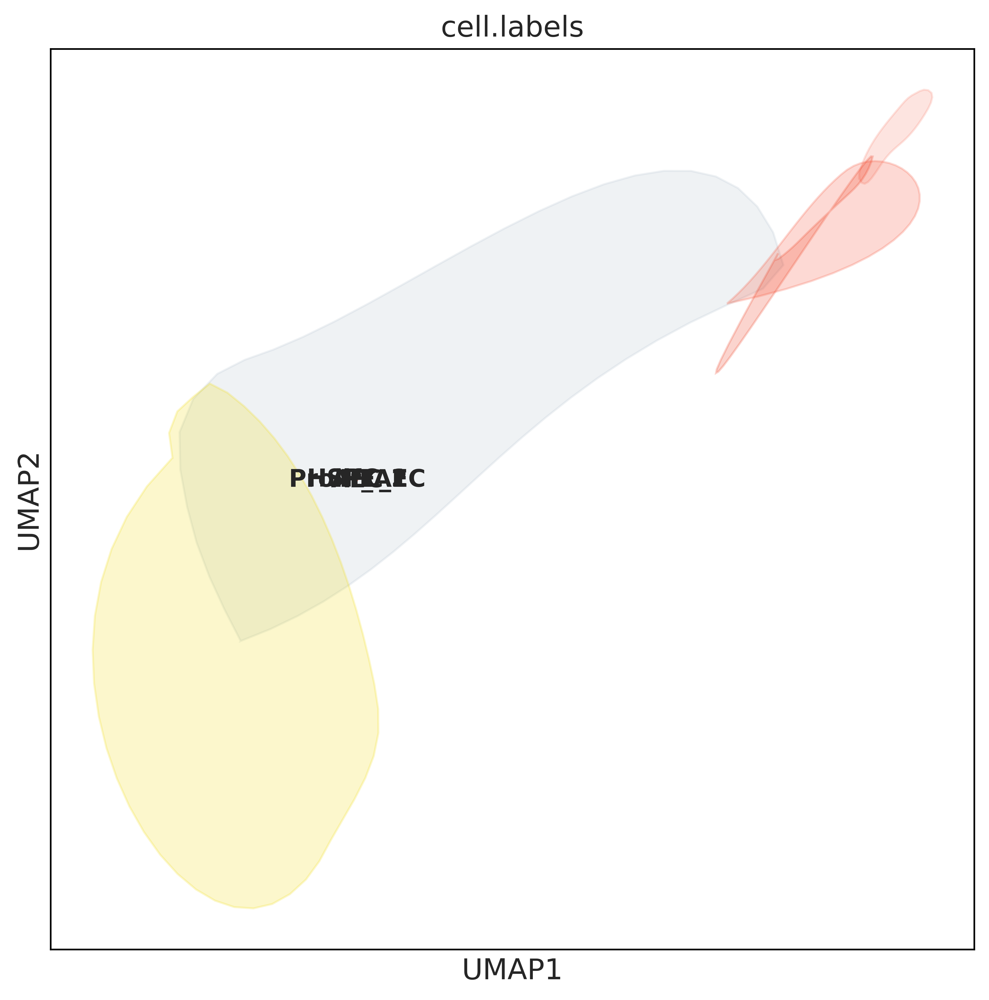

In [34]:
# data
data = adata[:]
var = 'cell.labels'
obsm = 'X_draw_graph_fa'

## With Interpolation
from sklearn.cluster import KMeans
from scipy import interpolate
from scipy.spatial import ConvexHull, convex_hull_plot_2d
fig, ax = plt.subplots(1, figsize=(8,8))
colors = pd.DataFrame( data.obs['col'].values,index = data.obs[var])
colors = colors.groupby(colors.index).head(1)
col_pal = dict(zip(colors.index.values,colors.iloc[:,0] ))

umap_coord = pd.DataFrame(data.obsm[obsm],columns = ['umap_1','umap_2'])
umap_coord['cluster'] = data.obs[var].values


p4 = sc.pl.umap(data, color =var,legend_loc='on data',size=2,legend_fontsize='small',ax=ax,show=False, palette= col_pal) #title=i

for i in umap_coord.cluster.unique():
    points = umap_coord[umap_coord.cluster == i][['umap_1', 'umap_2']].values
    
    #Only take centralised points into account here
    # Get centroid info
    from scipy.spatial import distance
    import numpy as np
    X =  umap_coord[umap_coord.cluster == i][['umap_1', 'umap_2']].values
    y = umap_coord[umap_coord.cluster == i][['cluster']].values
    kmeans = KMeans(n_clusters=1).fit(X)
    centroid_distance = pd.DataFrame(distance.cdist(points, kmeans.cluster_centers_, 'euclidean'))
    mean = np.mean(centroid_distance)
    sd = np.std(centroid_distance)
    #points = points[[centroid_distance.index[centroid_distance.iloc[:,0].astype(float) <= float((mean) + 1.96*(std))].values]]
    
    # Get KNN info
    X =  points
    k = 20
    # importing NearestNeighbors class 
    from sklearn.neighbors import NearestNeighbors
    # initialize model
    neigh = NearestNeighbors(n_neighbors=k, n_jobs=-1)
    # train for getting nearest neighbour
    neigh.fit(X)
    dist, ind = neigh.kneighbors(X)
    # Get dist to knn
    distances = pd.DataFrame( [dist[i][k - 1] for i in range(len(dist))])
    mean = np.mean(distances.iloc[:,0])
    sd = np.std(distances.iloc[:,0])
    thresh = float((mean) + 1.96*(sd))
    points = points[distances.index[distances.iloc[:,0].astype(float) <= thresh].values]
    
    
    # get convex hull
    hull = ConvexHull(points)
    # get x and y coordinates
    # repeat last point to close the polygon
    x_hull = np.append(points[hull.vertices,0],
                       points[hull.vertices,0][0])
    y_hull = np.append(points[hull.vertices,1],
                       points[hull.vertices,1][0])
    
    # interpolate
    dist = np.sqrt((x_hull[:-1] - x_hull[1:])**2 + (y_hull[:-1] - y_hull[1:])**2)
    dist_along = np.concatenate(([0], dist.cumsum()))
    spline, u = interpolate.splprep([x_hull, y_hull], 
                                    u=dist_along, s=0)
    interp_d = np.linspace(dist_along[0], dist_along[-1], 50)
    interp_x, interp_y = interpolate.splev(interp_d, spline)
    # plot shape
    plt.fill(interp_x, interp_y, '--', c=''.join(colors.loc[i].astype(str)), alpha=0.2)
    
#plt.xlim(0,200)
#plt.ylim(0,200)

In [97]:
#points = umap_coord[umap_coord.cluster == i][['umap_1', 'umap_2']].values
points = adata.obsm['X_draw_graph_fa']
#Only take centralised points into account here
# Get centroid info
from scipy.spatial import distance
import numpy as np
X =  umap_coord[umap_coord.cluster == i][['umap_1', 'umap_2']].values
y = umap_coord[umap_coord.cluster == i][['cluster']].values

In [98]:
kmeans = KMeans(n_clusters=1).fit(X)
centroid_distance = pd.DataFrame(distance.cdist(points, kmeans.cluster_centers_, 'euclidean'))
mean = np.mean(centroid_distance)
sd = np.std(centroid_distance)
#points = points[[centroid_distance.i

In [99]:
# Get KNN info
X =  points
k = 20
# importing NearestNeighbors class 
from sklearn.neighbors import NearestNeighbors
# initialize model
neigh = NearestNeighbors(n_neighbors=k, n_jobs=-1)
# train for getting nearest neighbour
neigh.fit(X)
dist, ind = neigh.kneighbors(X)
# Get dist to knn
distances = pd.DataFrame( [dist[i][k - 1] for i in range(len(dist))])
mean = np.mean(distances.iloc[:,0])
sd = np.std(distances.iloc[:,0])
thresh = float((mean) + 1.96*(sd))
points = points[distances.index[distances.iloc[:,0].astype(float) <= thresh].values]

In [100]:
dist_along

array([   0.        , 3657.10752079, 3991.32036658, 4230.849101  ,
       4574.98052964, 7344.30303856])

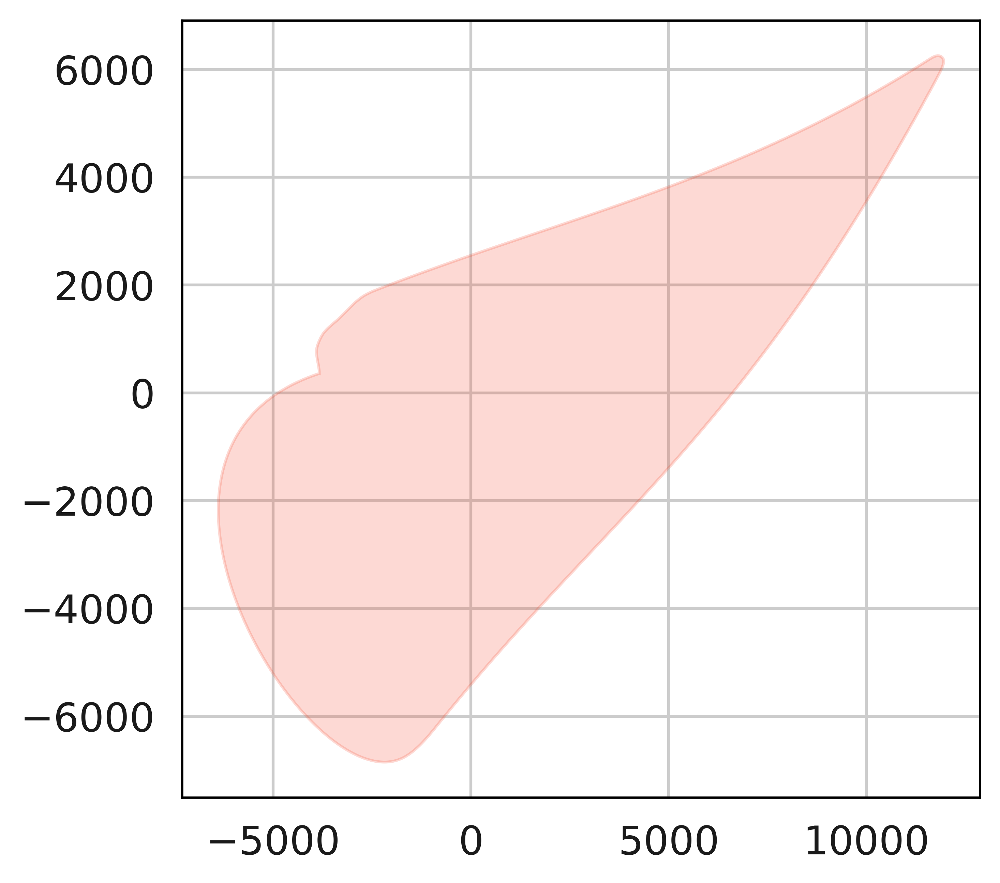

In [101]:
# get convex hull
hull = ConvexHull(points)
# get x and y coordinates
# repeat last point to close the polygon
x_hull = np.append(points[hull.vertices,0],
                   points[hull.vertices,0][0])
y_hull = np.append(points[hull.vertices,1],
                   points[hull.vertices,1][0])

# interpolate
dist = np.sqrt((x_hull[:-1] - x_hull[1:])**2 + (y_hull[:-1] - y_hull[1:])**2)
dist_along = np.concatenate(([0], dist.cumsum()))
spline, u = interpolate.splprep([x_hull, y_hull], 
                                u=dist_along, s=10)
interp_d = np.linspace(dist_along[0], dist_along[-1], 1000)
interp_x, interp_y = interpolate.splev(interp_d, spline)
# plot shape
plt.fill(interp_x, interp_y, '--', c=''.join(colors.loc[i].astype(str)), alpha=0.2)

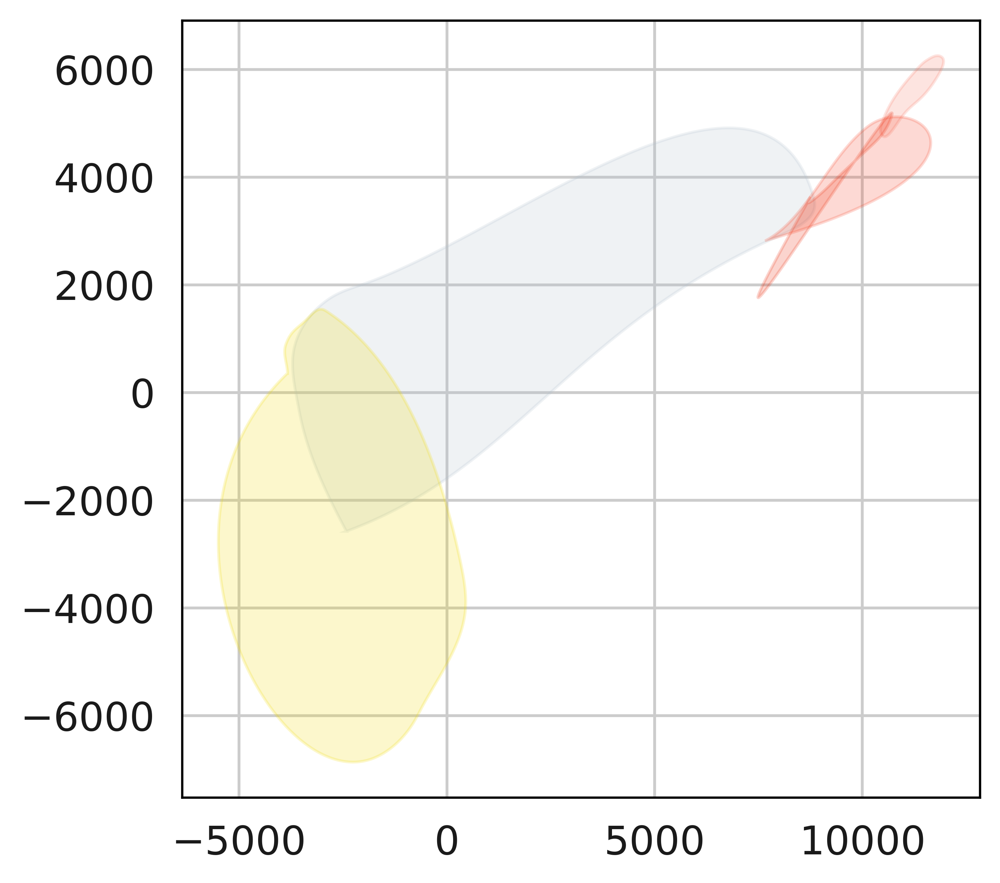

In [102]:
for i in umap_coord.cluster.unique():
    points = umap_coord[umap_coord.cluster == i][['umap_1', 'umap_2']].values
    
    #Only take centralised points into account here
    # Get centroid info
    from scipy.spatial import distance
    import numpy as np
    X =  umap_coord[umap_coord.cluster == i][['umap_1', 'umap_2']].values
    y = umap_coord[umap_coord.cluster == i][['cluster']].values
    kmeans = KMeans(n_clusters=1).fit(X)
    centroid_distance = pd.DataFrame(distance.cdist(points, kmeans.cluster_centers_, 'euclidean'))
    mean = np.mean(centroid_distance)
    sd = np.std(centroid_distance)
    #points = points[[centroid_distance.index[centroid_distance.iloc[:,0].astype(float) <= float((mean) + 1.96*(std))].values]]
    
    # Get KNN info
    X =  points
    k = 20
    # importing NearestNeighbors class 
    from sklearn.neighbors import NearestNeighbors
    # initialize model
    neigh = NearestNeighbors(n_neighbors=k, n_jobs=-1)
    # train for getting nearest neighbour
    neigh.fit(X)
    dist, ind = neigh.kneighbors(X)
    # Get dist to knn
    distances = pd.DataFrame( [dist[i][k - 1] for i in range(len(dist))])
    mean = np.mean(distances.iloc[:,0])
    sd = np.std(distances.iloc[:,0])
    thresh = float((mean) + 1.96*(sd))
    points = points[distances.index[distances.iloc[:,0].astype(float) <= thresh].values]
    
    
    # get convex hull
    hull = ConvexHull(points)
    # get x and y coordinates
    # repeat last point to close the polygon
    x_hull = np.append(points[hull.vertices,0],
                       points[hull.vertices,0][0])
    y_hull = np.append(points[hull.vertices,1],
                       points[hull.vertices,1][0])

    # interpolate
    dist = np.sqrt((x_hull[:-1] - x_hull[1:])**2 + (y_hull[:-1] - y_hull[1:])**2)
    dist_along = np.concatenate(([0], dist.cumsum()))
    spline, u = interpolate.splprep([x_hull, y_hull], 
                                    u=dist_along, s=10)
    interp_d = np.linspace(dist_along[0], dist_along[-1], 1000)
    interp_x, interp_y = interpolate.splev(interp_d, spline)
    # plot shape
    plt.fill(interp_x, interp_y, '--', c=''.join(colors.loc[i].astype(str)), alpha=0.2)
    
#plt.xlim(0,200)
#plt.ylim(0,200)